<a href="https://colab.research.google.com/github/Isabel-Su/Wave-Simulator/blob/main/Copy_of_5_22_25_APC_Wave_Simulation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 5/22/25 Version of Wave Simulator
* creates a pulse in the middle of the string
* the string seems really elastic/the first pulse always creates some other pulse on the bottom causing a really drastic up/down wave
* since the pulse is in the middle, changes/waves propagate outwards on both sides

In [ ]:
# %matplotlib notebook

import numpy as np
import matplotlib.pyplot as plt

from matplotlib.animation import FuncAnimation

from IPython.display import HTML


In [ ]:
N = 100  # num of blocks
k = 1000.0  # spr const (initially 100.0, but tried 1000.0 for fun :D)
m = 1.0  # mass of each block
dt = .01  # time step


In [ ]:
y = np.zeros(N)
v = np.zeros(N)
a = np.zeros(N)

y[N // 2] = 1.0  # initial pulse
# y[1] = 1.0

In [ ]:
def step():
  global y, v, a
  a_f = np.zeros(N)
  for i in range(1, N-1):  # fixed boundaries
    a_f[i] = (k / m) * (y[i-1] + y[i+1] - 2 * y[i])  # plug into general formula
    # print(y[i])
  v += a_f * dt  # algebraic integration (for now?)
  y += v * dt
  a = a_f

In [ ]:
def animate(frame):
  step()
  line.set_ydata(y)
  return line,

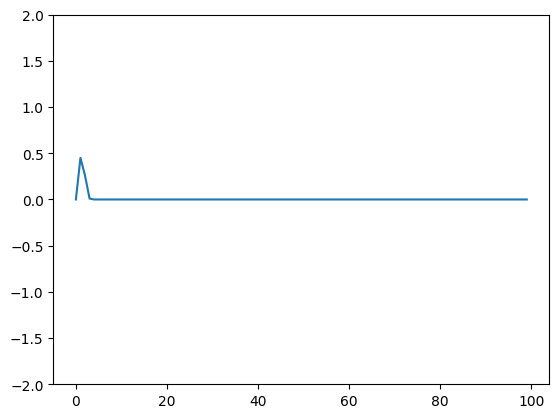

In [ ]:
fig, ax = plt.subplots()
line, = ax.plot(range(N), y)
ax.set_ylim(-2,2)
ani = FuncAnimation(fig, animate, frames=500, interval=20, cache_frame_data=False, blit=True)
plt.show()

HTML(ani.to_jshtml())

testing stuff below

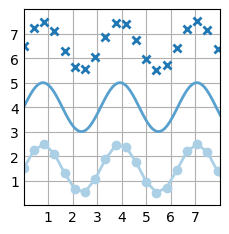

In [ ]:
plt.style.use('_mpl-gallery')

# make data
x = np.linspace(0, 10, 100)
y = 4 + 1 * np.sin(2 * x)
x2 = np.linspace(0, 10, 25)
y2 = 4 + 1 * np.sin(2 * x2)

# plot
fig, ax = plt.subplots()

ax.plot(x2, y2 + 2.5, 'x', markeredgewidth=2)
ax.plot(x, y, linewidth=2.0)
ax.plot(x2, y2 - 2.5, 'o-', linewidth=2)

ax.set(xlim=(0, 8), xticks=np.arange(1, 8),
       ylim=(0, 8), yticks=np.arange(1, 8))

plt.show()

<ipython-input-10-28fe748e7796>:3: UserWarning: frames=None which we can infer the length of, did not pass an explicit *save_count* and passed cache_frame_data=True.  To avoid a possibly unbounded cache, frame data caching has been disabled. To suppress this warning either pass `cache_frame_data=False` or `save_count=MAX_FRAMES`.
  ani = FuncAnimation(fig, func, interval=20)
/usr/local/lib/python3.11/dist-packages/matplotlib/animation.py:908: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you output the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(


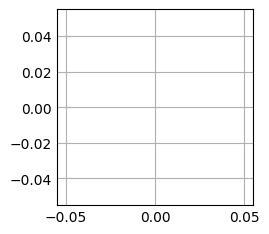

In [ ]:
fig, ax = plt.subplots()
line = ax.plot()
ani = FuncAnimation(fig, func, interval=20)
plt.show()